In [1]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import random
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
import torch.optim as optim
from collections import deque
from IPython.display import Image as IPImage, display

In [2]:
d = 0.99 # fattore di dimenticanza
vision = 5 # raggio di visione dell'agente
rows = 100 
columns = 100
batch_size = 128
num_episodes = 500
episode_duration = 1000
state_dim = 514
action_dim = 4
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
# Define Deep Q-Network (DQN) Model
class DQN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(DQN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc2 = nn.Linear(128, 256)
        self.fc3 = nn.Linear(256, output_dim)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

In [4]:
def update_env(env, agent_pos, vision, d):
    rows, cols = env.shape
    agent_row, agent_col = agent_pos # posizione dell'agente (riga, colonna)

    C, R = np.ogrid[:rows, :cols] # genera due matrici che rappresentano gli indici delle righe e delle colonne della griglia
                                  # C è una colonna di indici delle righe, ha dimensione (rows, 1))
                                  # R è una riga di indici delle colonne, ha dimensione (1, cols)
    
    distance = np.sqrt((C - agent_row) ** 2 + (R - agent_col) ** 2) # matrice delle distanze tra ogni cella e l'agente

    new_env = env.copy()

    new_env[distance <= vision] = 1.0
    new_env[distance > vision] *= d

    return new_env

In [5]:
def get_reward(old_env, new_env):
    return np.sum(new_env - old_env)

In [6]:
class Agent:
    def __init__(self, state_dim, action_dim, pos, lr, alpha, epsilon, buffer_size, Tr, device):
        self.state_dim = state_dim
        self.action_dim = action_dim
        self.pos = pos
        self.lr = lr
        self.alpha = alpha
        self.epsilon = epsilon
        self.device = device
        self.memory = deque(maxlen=buffer_size)
        self.cnn = self._init_cnn()
        self.learned_net = DQN(state_dim, action_dim).to(self.device)
        self.target_net = DQN(state_dim, action_dim).to(self.device)
        self.target_net.load_state_dict(self.learned_net.state_dict()) # i pesi delle due DQN sono uguali all'inizio
        self.target_net.eval()
        self.optimizer = optim.Adam(self.learned_net.parameters(), lr=lr)
        self.Tr = Tr

    def _init_cnn(self):
        cnn = models.resnet18(pretrained=True)
        cnn = nn.Sequential(*(list(cnn.children())[:-1]), torch.nn.Flatten()) # rimuove il layer fully connected
        cnn.to(self.device)
        cnn.eval()
        return cnn    

    def preprocess_img(self, img):
        transform = transforms.Compose([
            transforms.Resize(224),
            transforms.Grayscale(num_output_channels=3), # da 1 a 3 canali
            transforms.ToTensor() # conversione in tensore con valori float nuovamente tra 0 e 1
        ])

        return(transform(img).unsqueeze(0).to(self.device))

    def get_state(self, env):    
        env_img = Image.fromarray((env*255.0).astype(np.uint8), mode="L") 
        env_img_tensor = self.preprocess_img(env_img)
        with torch.no_grad():
            env_features = self.cnn(env_img_tensor)
        env_features = env_features.squeeze(0) # rimuove la prima dimensione(ora la shape è torch.Size([512]))
        agent_pos_tensor = torch.tensor(self.pos, dtype=torch.float32, device=self.device)
        state = torch.cat([agent_pos_tensor, env_features])
        return state    

    def choose_action(self, state, evaluation = False):
        if evaluation: # greedy puro
            with torch.no_grad():
                q_values = self.learned_net(state)
            return torch.argmax(q_values).item()  
        else:
            if np.random.rand() <= self.epsilon:
                return np.random.choice(self.action_dim) # esplorazione
            q_values = self.learned_net(state)
            return torch.argmax(q_values).item() # exploitation
    
    def execute_action(self, env, action):
        match action:
            case 0: # left
                if(self.pos[1]!=0):
                    self.pos[1]-=1
            case 1: # right
                if(self.pos[1]!=env.shape[1]-1):
                    self.pos[1]+=1
            case 2: # up
                if(self.pos[0]!=0):
                    self.pos[0]-=1
            case 3: # down
                if(self.pos[0]!=env.shape[0]-1):
                    self.pos[0]+=1

    def update_epsilon(self, decay_rate=0.99995):
        self.epsilon = max(0.01, self.epsilon * decay_rate)

    def remember(self, state, action, reward, next_state):
        self.memory.append((state, action, reward, next_state))

    def replay(self, batch_size, t):
        if len(self.memory) < batch_size: # non ci sono ancora abbastanza dati nel buffer
            return
        minibatch = random.sample(self.memory, batch_size)
        states, actions, rewards, next_states = zip(*minibatch)  # scompatta il batch in liste separate

        states = torch.stack([torch.tensor(s, dtype=torch.float32, device=self.device) for s in states])  # [batch_size, state_dim]
        actions = torch.tensor(actions, dtype=torch.long, device=self.device).unsqueeze(1) # [batch_size, 1]
        rewards = torch.tensor(rewards, dtype=torch.float32, device=self.device) # [batch_size]
        next_states = torch.stack([torch.tensor(ns, dtype=torch.float32, device=self.device) for ns in next_states])  # [batch_size, state_dim]
        
        # calcola i targets tramite la target network
        targets = (rewards + self.alpha * self.target_net(next_states).max(dim=1)[0]).detach() # [batch_size]
        
        # calcola i q_values tramite la learned network e, per ogni esempio del batch, prende solo quello relativo
        # all'azione effettivamente eseguita
        q_values = self.learned_net(states).gather(1, actions).squeeze(1)

        self.optimizer.zero_grad()
        loss = 0.5 * nn.MSELoss(reduction="sum")(q_values, targets)
        loss.backward()
        self.optimizer.step()
        if(t % self.Tr == 0):
            self.target_net.load_state_dict(self.learned_net.state_dict())


In [7]:
# salvataggio dell'agente

def save_agent(agent, filename="agent_checkpoint.pt"):
    checkpoint = {
        "learned_net_state": agent.learned_net.state_dict(),
        "target_net_state": agent.target_net.state_dict(),
        "optimizer_state": agent.optimizer.state_dict(),
        "memory": list(agent.memory),  # converte deque in lista
        "epsilon": agent.epsilon,
    }
    torch.save(checkpoint, filename)
    print(f"Checkpoint saved in {filename}")

In [8]:
def load_agent(agent, filename="agent_checkpoint.pt"):
    checkpoint = torch.load(filename, map_location=agent.device, weights_only=False)
    
    agent.learned_net.load_state_dict(checkpoint["learned_net_state"])
    agent.target_net.load_state_dict(checkpoint["target_net_state"])
    agent.optimizer.load_state_dict(checkpoint["optimizer_state"])
    agent.memory = deque(checkpoint["memory"], maxlen=len(agent.memory))  # ricostruisce la deque
    agent.epsilon = checkpoint["epsilon"]

    print(f"Checkpoint loaded from {filename}")

In [14]:
agent = Agent(state_dim, action_dim, pos=None, lr=0.001, alpha=0.9, epsilon=1.0, buffer_size=100000, Tr=200, 
              device=device)

/data01/iva24alesan/miniconda3/envs/MAS/lib/python3.13/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/data01/iva24alesan/miniconda3/envs/MAS/lib/python3.13/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [21]:
load_agent(agent, "agent_checkpoint.pt")

Checkpoint loaded from agent_checkpoint.pt


In [22]:
initial_episode = 1000

In [23]:
# Addestramento

for episode in range(initial_episode, initial_episode + num_episodes):
    total_reward = 0
    env = np.zeros((rows, columns), dtype=np.float32)
    agent.pos = [random.randint(0, rows - 1), random.randint(0, columns - 1)]
    env = update_env(env, agent.pos, vision, d)
    state = agent.get_state(env)
    for t in range(episode_duration):
        action = agent.choose_action(state)
        # print(f"Azione scelta: {action}")  # Debug
        agent.execute_action(env, action)
        new_env = update_env(env, agent.pos, vision, d)
        reward = get_reward(env, new_env)
        #print(f"Reward ottenuto: {reward}")  # Debug
        # print(f"Nuova posizione agente: {agent.pos}")  # Debug
        next_state = agent.get_state(new_env)
        agent.remember(state, action, reward, next_state)
        env = new_env
        state = next_state
        total_reward += reward
        agent.replay(batch_size, t)
        agent.update_epsilon()
    print(f"Episode: {episode + 1}, Total Reward: {total_reward}")    

print("\nTraining done!")

Episode: 1001, Total Reward: 930.4102783203125
Episode: 1002, Total Reward: 727.2675170898438
Episode: 1003, Total Reward: 123.777099609375
Episode: 1004, Total Reward: 1016.5281982421875
Episode: 1005, Total Reward: 999.7381591796875
Episode: 1006, Total Reward: 984.6104125976562
Episode: 1007, Total Reward: 1029.4534912109375
Episode: 1008, Total Reward: 824.8030395507812
Episode: 1009, Total Reward: 637.6956787109375
Episode: 1010, Total Reward: 737.4017333984375
Episode: 1011, Total Reward: 804.155517578125
Episode: 1012, Total Reward: 987.518310546875
Episode: 1013, Total Reward: 889.893310546875
Episode: 1014, Total Reward: 863.25634765625
Episode: 1015, Total Reward: 990.621337890625
Episode: 1016, Total Reward: 990.5866088867188
Episode: 1017, Total Reward: 847.6224975585938
Episode: 1018, Total Reward: 973.9778442382812
Episode: 1019, Total Reward: 975.380859375
Episode: 1020, Total Reward: 1025.881591796875
Episode: 1021, Total Reward: 657.7409057617188
Episode: 1022, Total R

In [24]:
save_agent(agent, "agent_checkpoint.pt")

Checkpoint saved in agent_checkpoint.pt


In [18]:
def init_plot(frames):
    fig, ax = plt.subplots(figsize=(8, 8))
    img = ax.imshow(frames[0][0], cmap='gray', vmin=0, vmax=1, interpolation='nearest')
    ax.set_aspect('equal')  # celle quadrate
    agent_dot, = ax.plot([], [], 'ro', markersize=2)
    reward_text = ax.text(0, -5, "", fontsize=12, color="black", ha="left", va="top")

    ax.set_xticks(np.arange(-0.5, columns, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, rows, 1), minor=True)
    ax.grid(which='minor', color='black', linestyle='-', linewidth=0.5)
    ax.tick_params(which='both', bottom=False, left=False, labelbottom=False, labelleft=False)

    return fig, ax, img, agent_dot, reward_text

In [19]:
# Funzione per aggiornare l'animazione
def update(frame_data, img, agent_dot, reward_text):
    env, agent_pos, reward = frame_data
    img.set_array(env)
    agent_dot.set_data([agent_pos[1]], [agent_pos[0]])
    reward_text.set_text(f"Reward: {reward:.2f}")

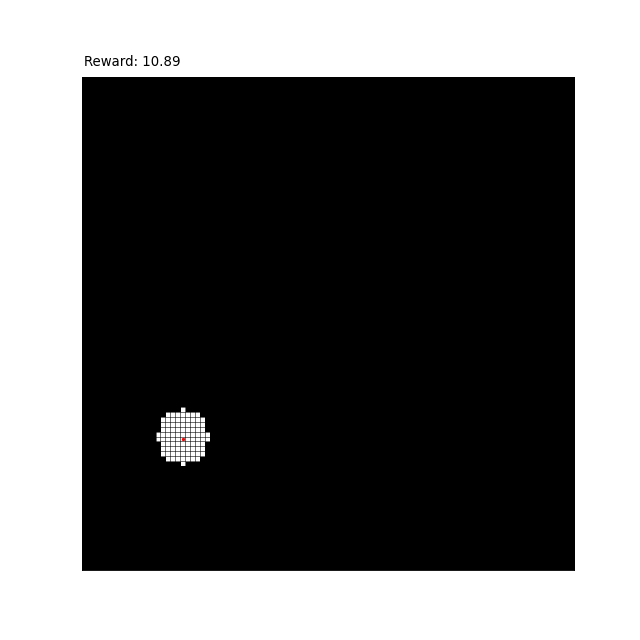

In [26]:
# Evaluation

env = np.zeros((rows, columns), dtype=np.float32)
agent.pos=[random.randint(0, rows - 1), random.randint(0, columns - 1)]
env = update_env(env, agent.pos, vision, d)
state = agent.get_state(env)

all_frames = []

for t in range(episode_duration):
    action = agent.choose_action(state, evaluation=True)
    agent.execute_action(env, action)
    new_env = update_env(env, agent.pos, vision, d)
    reward = get_reward(env, new_env)
    next_state = agent.get_state(new_env)
    all_frames.append((new_env.copy(), agent.pos.copy(), reward))
    env = new_env
    state = next_state

fig, ax, img, agent_dot, reward_text = init_plot(all_frames)

ani = animation.FuncAnimation(
    fig, update, frames=all_frames, fargs=(img, agent_dot, reward_text), interval=250, repeat=False)

gif_filename = "simulation.gif"
ani.save(gif_filename, writer='pillow', dpi=80)

plt.close(fig)

# Mostra la GIF direttamente nel notebook
display(IPImage(filename=gif_filename))

